In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.cuda
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms
import os
from joblib import dump, load
from PIL import Image
from tqdm.notebook import tqdm
from torch.nn.functional import relu
from torch.utils.data import DataLoader, Dataset
from SHG import SHG
from utils import *
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.base import clone
from sklearn.preprocessing import StandardScaler

In [2]:
""" PATHS """
# Bottleneck data path
DATA_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space_data/data/"

# Ground truth heatmaps
HEATMAPS_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/heatmaps/"

# Path for model
MODEL_DIR = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/models/Mon_Apr_12_18-11-59_2021/epoch_46.pth"

# Path for mean rgb
average_rgb = np.loadtxt("./average_rgb.npy")

# Saving path
SAVING_PATH = "C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/"

In [3]:
""" LOADING """
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model_without_branches = SHG(num_hourglasses = 1, use_skip_connections = False).to(device)
model_with_branches = SHG(num_hourglasses = 1, use_skip_connections = True).to(device)

model_without_branches.load_state_dict(torch.load(MODEL_DIR))
model_with_branches.load_state_dict(torch.load(MODEL_DIR))

model_without_branches.eval()
model_with_branches.eval()

X, y, IDs = load_data(DATA_PATH, HEATMAPS_PATH)

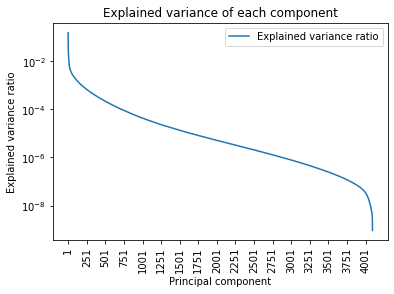

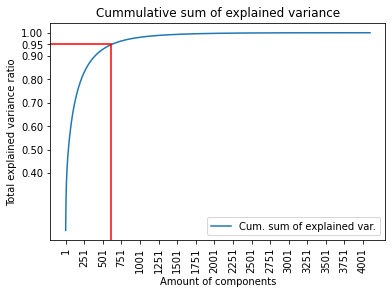

In [4]:
""" PCA on the full data to create visualizations """

scaler = StandardScaler().fit(X)
pca_full = PCA(n_components = X.shape[1]).fit(scaler.transform(X))

plt.figure()
plt.title("Explained variance of each component")
plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.plot(np.arange(0, X.shape[1]), pca_full.explained_variance_ratio_, label = "Explained variance ratio")
plt.legend()
plt.xticks(np.arange(1, X.shape[1] + 1, 250), rotation = 90)
plt.yscale("log")
plt.show()

plt.figure()
plt.title("Cummulative sum of explained variance")
plt.xlabel("Amount of components")
plt.ylabel("Total explained variance ratio")
plt.plot(np.arange(0, X.shape[1]), np.cumsum(pca_full.explained_variance_ratio_), label = "Cum. sum of explained var.")
plt.axhline(y=0.95, color='r', linestyle='-', xmax = 740/len(pca_full.explained_variance_ratio_))
plt.axvline(x=605, color='r', linestyle='-', ymax = 0.90)
plt.legend()
plt.xticks(np.arange(1, X.shape[1] + 1, 250), rotation = 90)
plt.yticks(np.append(np.arange(0.4, 1.1, 0.1), 0.95))
plt.show()

In [5]:
""" PCA to 2D data """
pca_2 = PCA(n_components=2).fit(scaler.transform(X))
X_2d = pca_2.transform(scaler.transform(X))
print("Explained variance:", np.sum(pca_2.explained_variance_ratio_))

Explained variance: 0.18793447


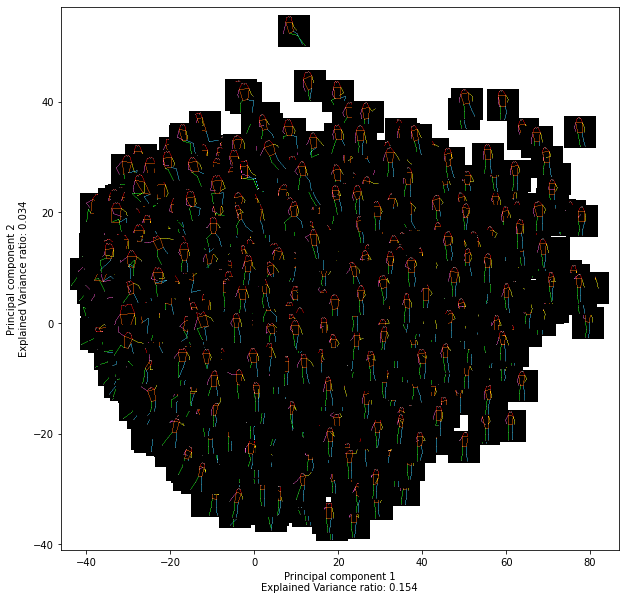

In [6]:
fig, ax = plt.subplots(figsize = (10, 10))

for x, y_ in zip(X_2d, y):
    y_ = turn_featuremaps_to_keypoints(y_)
    image = draw_skeleton(y_)
    im = OffsetImage(image, zoom = 0.5)
    ab = AnnotationBbox(im, (x[0], x[1]), xycoords = "data", frameon = False)
    ax.add_artist(ab)
    ax.update_datalim([(x[0], x[1])])
    ax.autoscale()

plt.xlabel("Principal component 1\nExplained Variance ratio: {:.3f}".format(pca_2.explained_variance_ratio_[0]))
plt.ylabel("Principal component 2\nExplained Variance ratio: {:.3f}".format(pca_2.explained_variance_ratio_[1]))
plt.show()

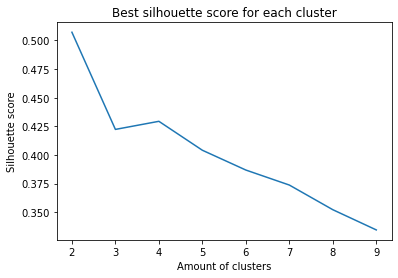

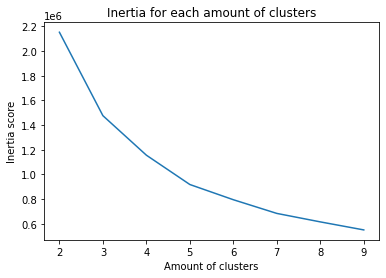

In [7]:
""" Running KMeans on the 2D data """
kmeans_model_2, pca_2_sil, centroids_2 = get_kmeans(X_2d)

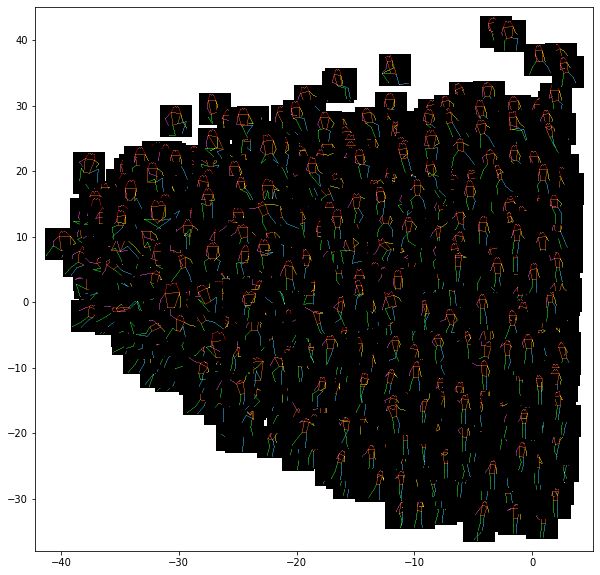

<Figure size 432x288 with 0 Axes>

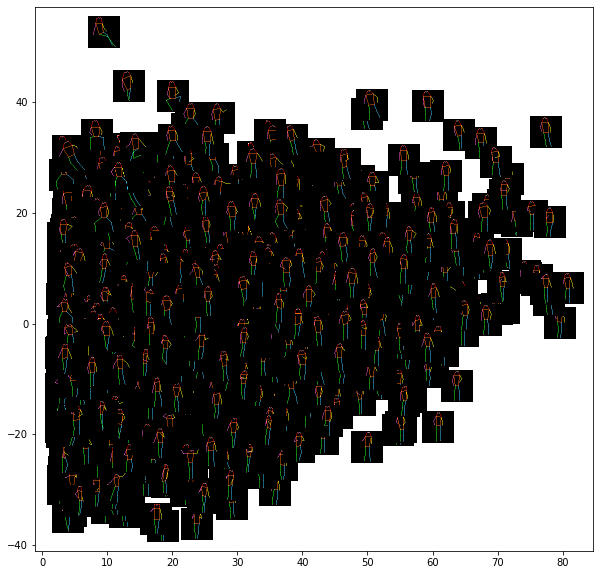

<Figure size 432x288 with 0 Axes>

In [8]:
""" Visualizing the clusters """
visualize_clusters(X_2d, y, kmeans_model_2)

In [9]:
""" Reverse PCA on the centroids """
centroids_2_inverted = scaler.inverse_transform(pca_2.inverse_transform(centroids_2)).reshape((centroids_2.shape[0], 256, 4, 4))

In [10]:
""" Decode the centroids """
centroids_2_decoded = model_without_branches.decode(torch.from_numpy(centroids_2_inverted).to(device))

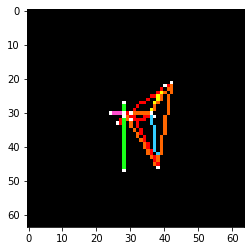

Closest point (dist: 0.3399905860424042):


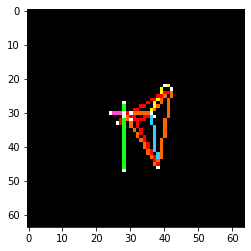

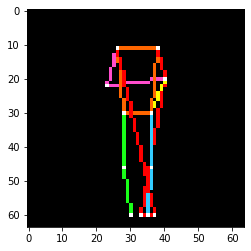

Closest point (dist: 0.5067247748374939):


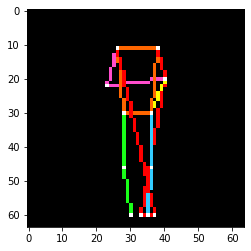

In [11]:
""" Visualize our predictions """
closest_points_2 = []

for i, (centroid_decoded, centroid) in enumerate(zip(centroids_2_decoded, centroids_2)):
    kps = turn_featuremaps_to_keypoints(centroid_decoded.cpu())
    skeleton = draw_skeleton(kps)
    plt.imshow(skeleton)
    #plt.savefig("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/2d_predictions_with_skip/kmeans_{}.png".format(i))
    plt.show()

    # Finding the closet point
    dists = np.linalg.norm(X_2d - centroid, axis = 1)
    closest_point = X_2d[np.argmin(dists)]
    closest_point = torch.from_numpy(scaler.inverse_transform(pca_2.inverse_transform(closest_point)).reshape((1, 256, 4, 4)))
    closest_points_2.append(closest_point.numpy().flatten())
    img = model_without_branches.decode(closest_point.to(device)).cpu()
    img = turn_featuremaps_to_keypoints(img)
    img = draw_skeleton(img)
    print("Closest point (dist: {}):".format(dists[np.argmin(dists)]))
    plt.imshow(img)
    plt.show()

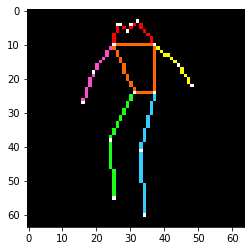

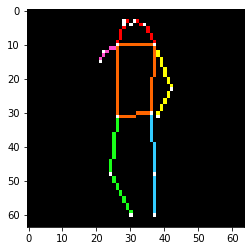

In [12]:
""" Visualizing the ground truth heatmap of the closest points to the centroids """
closest_points_2_ID = []
closest_points_2 = np.array(closest_points_2).reshape((len(centroids_2_inverted), -1))
closest_kp_2 = []

for centroid in closest_points_2:
    dists = np.linalg.norm(centroid - X, axis = 1)
    true_heatmaps = y[np.argmin(dists)]
    closest_points_2_ID.append(IDs[np.argmin(dists)][:-4])
    kp = turn_featuremaps_to_keypoints(true_heatmaps)
    closest_kp_2.append(kp)
    skeleton = draw_skeleton(kp)
    plt.imshow(skeleton)
    plt.show()

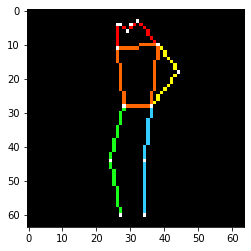

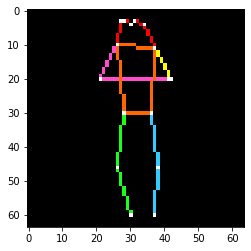

In [13]:
""" Looking at predictions of the nearest points to the centroids, with branches """
for x, y_ in zip(closest_points_2_ID, closest_kp_2):
    x = Image.open("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/image/" + x + ".png")
    x = TF.to_tensor(x)
    TF.normalize(x, average_rgb, [1, 1, 1], inplace = True)
    x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
    x = x.to(device, dtype = torch.float)
    pred, _ = model_with_branches(x)
    pred = pred.cpu()
    pred = turn_featuremaps_to_keypoints(pred)
    skeleton = draw_necessary_skeleton(pred, y_)
    plt.imshow(skeleton)
    plt.show()

In [14]:
""" Now we do the same, but instead with 625 components, which explains 95% of the variance """
pca_625 = PCA(n_components = 625).fit(scaler.transform(X))
X_625d = pca_625.transform(scaler.transform(X))
print("Explained variance:", np.sum(pca_625.explained_variance_ratio_))

Explained variance: 0.95017576


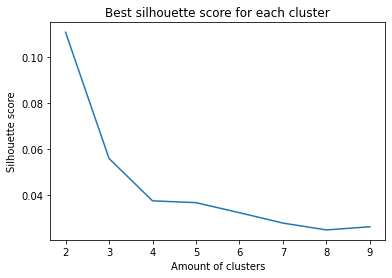

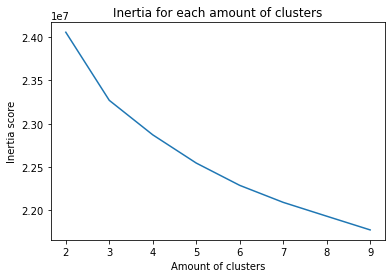

In [15]:
""" Running KMeans on the 625D data """
kmeans_model_625, pca_625_sil, centroids_625 = get_kmeans(X_625d)

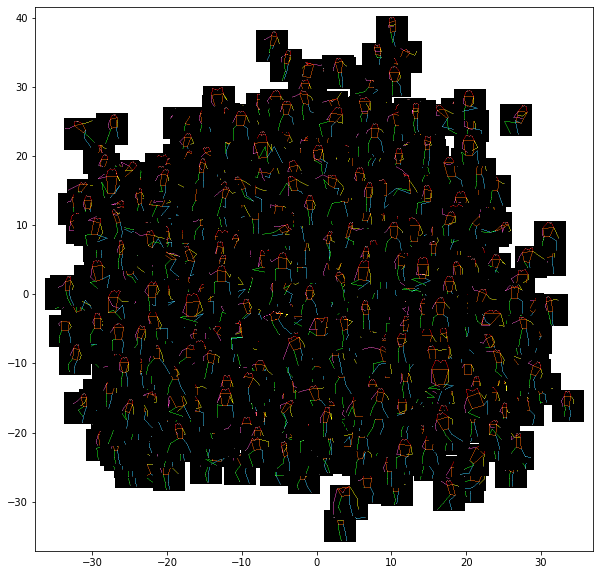

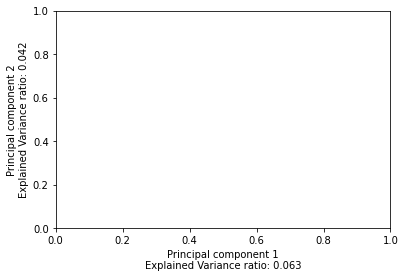

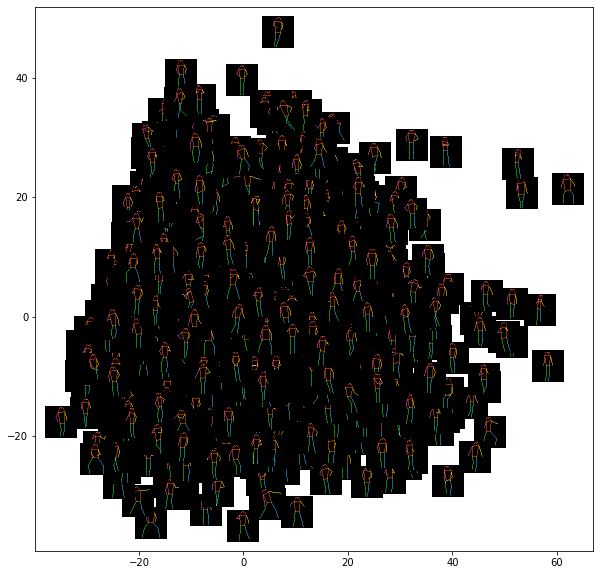

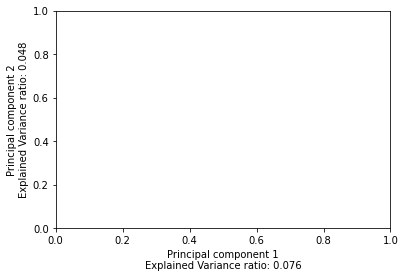

In [16]:
""" Visualizing the clusters """
visualize_clusters(X_625d, y, kmeans_model_625)

In [17]:
""" Reversing the centroids """
centroids_625_inverted = scaler.inverse_transform(pca_625.inverse_transform(centroids_625)).reshape((centroids_625.shape[0], 256, 4, 4))

In [18]:
""" Decode the centroids """
centroids_625_decoded = model_without_branches.decode(torch.from_numpy(centroids_625_inverted).to(device))

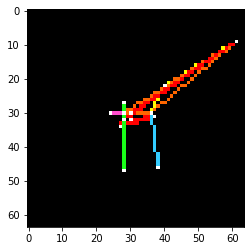

Closest point (dist: 37.48050308227539):


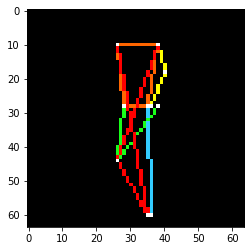

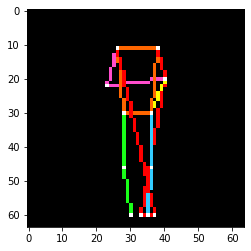

Closest point (dist: 38.929744720458984):


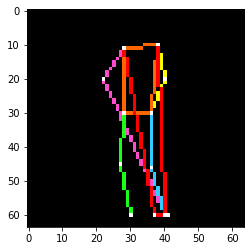

In [19]:
""" Visualize our predictions """
closest_points_625 = []

for i, (centroid_decoded, centroid) in enumerate(zip(centroids_625_decoded, centroids_625)):
    kps = turn_featuremaps_to_keypoints(centroid_decoded.cpu())
    skeleton = draw_skeleton(kps)
    plt.imshow(skeleton)
    #plt.savefig("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/2d_predictions_with_skip/kmeans_{}.png".format(i))
    plt.show()

    # Finding the closet point
    dists = np.linalg.norm(X_625d - centroid, axis = 1)
    closest_point = X_625d[np.argmin(dists)]
    closest_point = torch.from_numpy(scaler.inverse_transform(pca_625.inverse_transform(closest_point)).reshape((1, 256, 4, 4)))
    closest_points_625.append(closest_point.numpy().flatten())
    img = model_without_branches.decode(closest_point.to(device)).cpu()
    img = turn_featuremaps_to_keypoints(img)
    img = draw_skeleton(img)
    print("Closest point (dist: {}):".format(dists[np.argmin(dists)]))
    plt.imshow(img)
    plt.show()

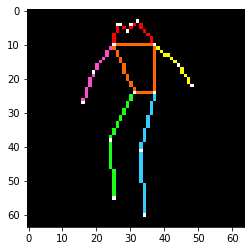

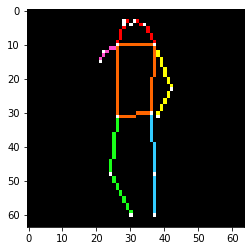

In [20]:
""" Visualizing the ground truth heatmap of the closest points to the centroids """
closest_points_625_ID = []
closest_points_625 = np.array(closest_points_625).reshape((len(centroids_625_inverted), -1))
closest_kp_625 = []

for centroid in closest_points_625:
    dists = np.linalg.norm(centroid - X, axis = 1)
    true_heatmaps = y[np.argmin(dists)]
    closest_points_625_ID.append(IDs[np.argmin(dists)][:-4])
    kp = turn_featuremaps_to_keypoints(true_heatmaps)
    closest_kp_625.append(kp)
    skeleton = draw_skeleton(kp)
    plt.imshow(skeleton)
    plt.show()

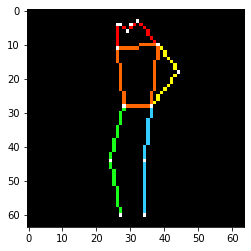

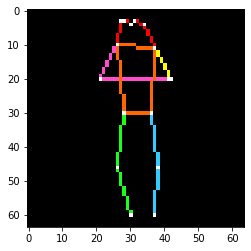

In [21]:
""" Looking at predictions of the nearest points to the centroids, with branches """
for x, y_ in zip(closest_points_625_ID, closest_kp_625):
    x = Image.open("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/image/" + x + ".png")
    x = TF.to_tensor(x)
    TF.normalize(x, average_rgb, [1, 1, 1], inplace = True)
    x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
    x = x.to(device, dtype = torch.float)
    pred, _ = model_with_branches(x)
    pred = pred.cpu()
    pred = turn_featuremaps_to_keypoints(pred)
    skeleton = draw_necessary_skeleton(pred, y_)
    plt.imshow(skeleton)
    plt.show()

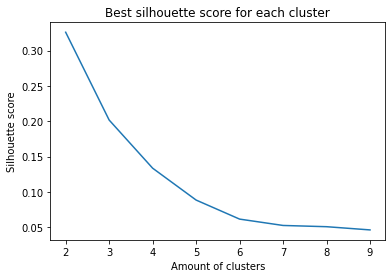

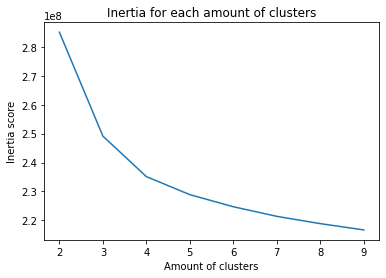

In [23]:
""" We now do the same on all of the feature (thus, without PCA). First we run KMeans on all of the data"""
kmeans_model_full, pca_full_sil, centroids_full = get_kmeans(X)

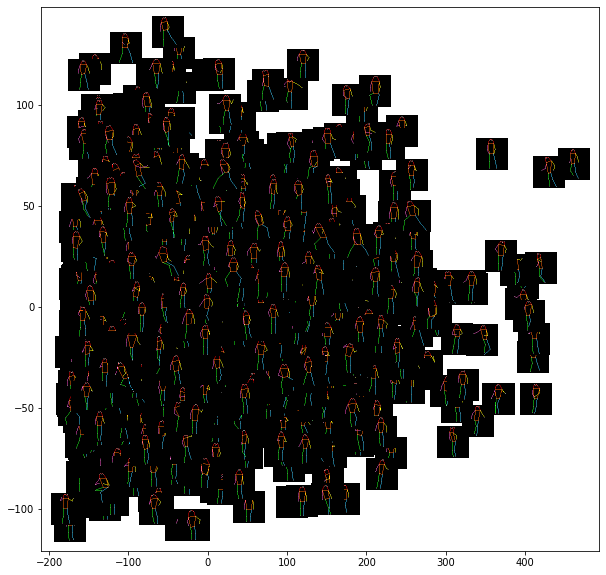

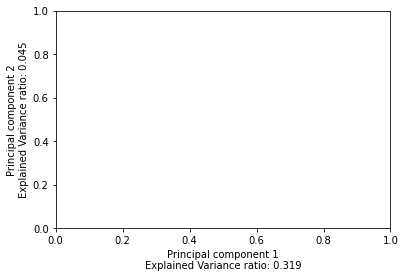

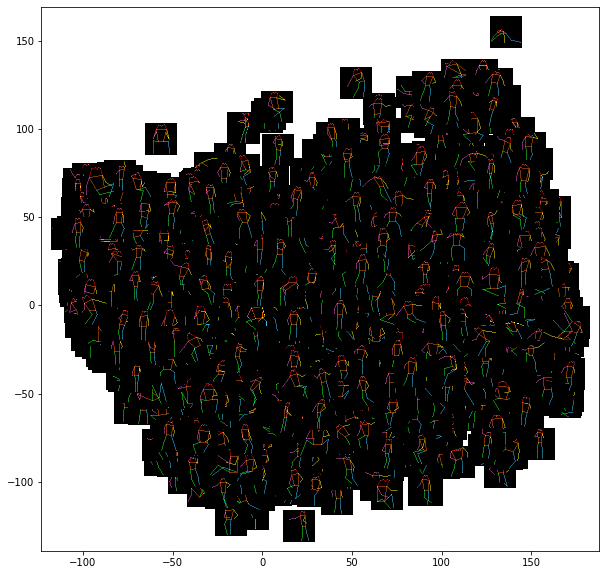

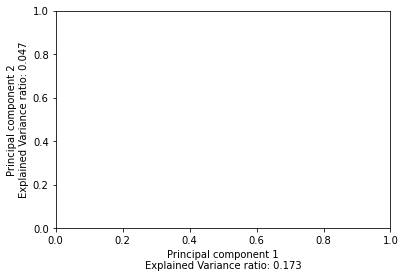

In [24]:
""" Visualizing the clusters """
visualize_clusters(X, y, kmeans_model_full)

In [8]:
""" Decode the centroids """
centroids_full_decoded = model_without_branches.decode(torch.from_numpy(centroids_full).reshape((centroids_full.shape[0], 256, 4, 4)).to(device))

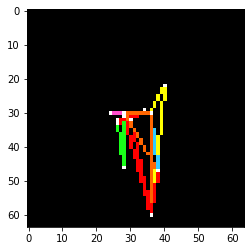

Closest point (dist: 119.71746826171875):


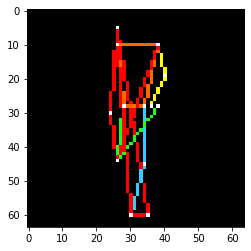

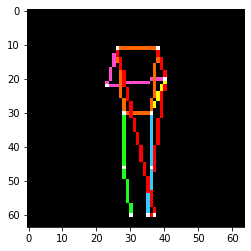

Closest point (dist: 125.27735137939453):


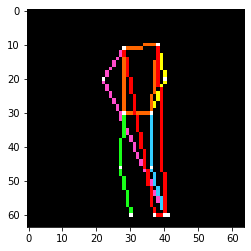

In [10]:
""" Visualize our predictions """
closest_points_full = []

for i, (centroid_decoded, centroid) in enumerate(zip(centroids_full_decoded, centroids_full)):
    kps = turn_featuremaps_to_keypoints(centroid_decoded.cpu())
    skeleton = draw_skeleton(kps)
    plt.imshow(skeleton)
    #plt.savefig("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/latent_space/2d_predictions_with_skip/kmeans_{}.png".format(i))
    plt.show()

    # Finding the closet point
    dists = np.linalg.norm(X - centroid, axis = 1)
    closest_point = X[np.argmin(dists)]
    closest_point = torch.from_numpy(closest_point.reshape((1, 256, 4, 4)))
    closest_points_full.append(closest_point.numpy().flatten())
    img = model_without_branches.decode(closest_point.to(device)).cpu()
    img = turn_featuremaps_to_keypoints(img)
    img = draw_skeleton(img)
    print("Closest point (dist: {}):".format(dists[np.argmin(dists)]))
    plt.imshow(img)
    plt.show()

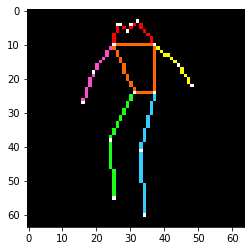

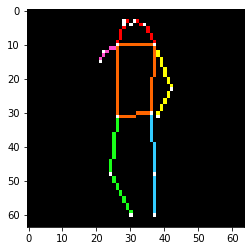

In [13]:
""" Visualizing the ground truth heatmap of the closest points to the centroids """
closest_points_full_ID = []
closest_points_full = np.array(closest_points_full).reshape((len(centroids_full_decoded), -1))
closest_kp_full = []

for centroid in closest_points_full:
    dists = np.linalg.norm(centroid - X, axis = 1)
    true_heatmaps = y[np.argmin(dists)]
    closest_points_full_ID.append(IDs[np.argmin(dists)][:-4])
    kp = turn_featuremaps_to_keypoints(true_heatmaps)
    closest_kp_full.append(kp)
    skeleton = draw_skeleton(kp)
    plt.imshow(skeleton)
    plt.show()

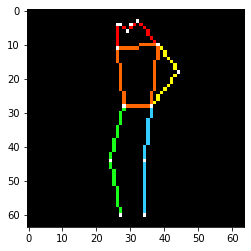

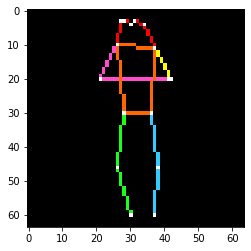

In [14]:
""" Looking at predictions of the nearest points to the centroids, with branches """
for x, y_ in zip(closest_points_full_ID, closest_kp_full):
    x = Image.open("C:/Users/André/OneDrive 2/OneDrive/Skrivebord/bsc_data/train/image/" + x + ".png")
    x = TF.to_tensor(x)
    TF.normalize(x, average_rgb, [1, 1, 1], inplace = True)
    x = x.reshape((1, x.shape[0], x.shape[1], x.shape[2]))
    x = x.to(device, dtype = torch.float)
    pred, _ = model_with_branches(x)
    pred = pred.cpu()
    pred = turn_featuremaps_to_keypoints(pred)
    skeleton = draw_necessary_skeleton(pred, y_)
    plt.imshow(skeleton)
    plt.show()